In [5]:
import pydicom
import os
import matplotlib.pyplot as plt 
from PIL import Image, ImageDraw
import pandas as pd
import numpy as np
import cv2

%matplotlib inline

In [6]:
def PolygonArea(corners):
    n = len(corners)
    area = 0.0
    for i in range(n):
        j = (i + 1) % n
        area += corners[i][0] * corners[j][1]
        area -= corners[j][0] * corners[i][1]
    area = abs(area) / 2.0
    return area


In [18]:
def process_image(img_gray):
    blurred = cv2.GaussianBlur(img_gray, (7, 7), 0)
    #blurred = abs(cv2.flip(blurred[::,256::], 1) - blurred[::,:256:])
    ret, thresh = cv2.threshold(blurred, 100, 255, 0)
    #thresh = abs(cv2.flip(thresh[::,256::], 1) - thresh[::,:256:])
    connectivity = 4
    ret, labels = cv2.connectedComponents(thresh)

    # Map component labels to hue val
    label_hue = np.uint8(179*labels/np.max(labels))
    blank_ch = 255*np.ones_like(label_hue)
    labeled_img = cv2.merge([label_hue, blank_ch, blank_ch])

    # cvt to BGR for display
    labeled_img = cv2.cvtColor(labeled_img, cv2.COLOR_HSV2BGR)

    # set bg label to black
    labeled_img[label_hue==0] = 0

    labeled_img = cv2.erode(labeled_img, np.ones((3,3), np.uint8), iterations=2)
#     labeled_img = cv2.dilate(labeled_img, None, iterations=4)
    return labeled_img, labels, ret

In [19]:
_a = process_image((img*(255./img.max())).astype('uint8'))

In [23]:
_a[1].max()

41

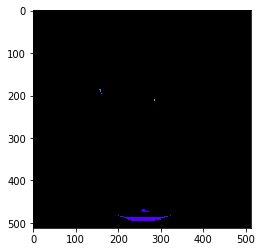

In [12]:
plt.imshow(process_image((img*(255./img.max())).astype('uint8')))

In [8]:
ok_data = ['353891',
'361113',
'363578',
'363740',
'380677',
'385185',
'385948',
'386348',
'387719']

353891
RS.353891.MR_1.dcm
new trumor!
14.8755
Found 1 images


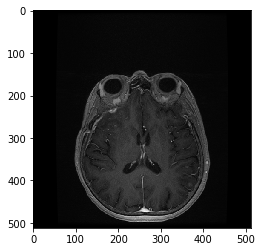

Area of poly: 84.5


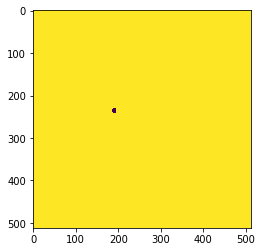

16.8755
Found 1 images


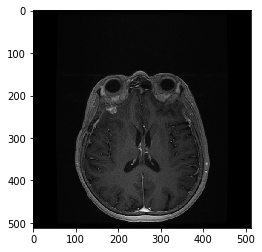

Area of poly: 322.5


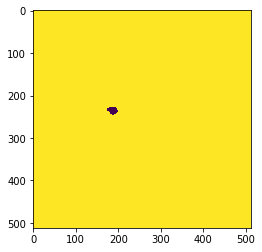

18.8755
Found 1 images


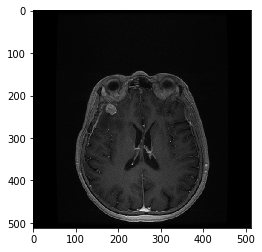

Area of poly: 497.5


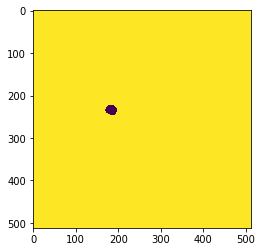

20.8755
Found 1 images


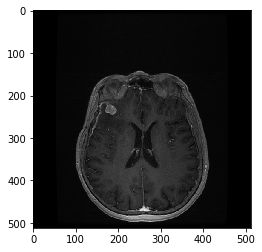

Area of poly: 508.0


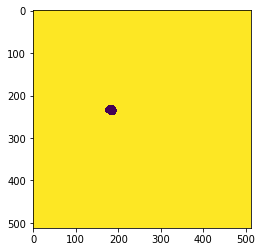

22.8755
Found 1 images


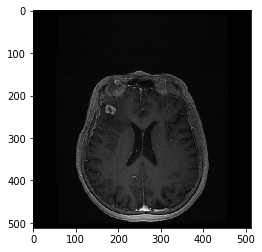

Area of poly: 458.0


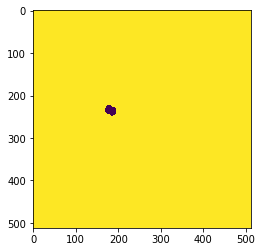

24.8755
Found 1 images


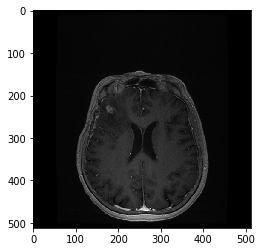

Area of poly: 376.5


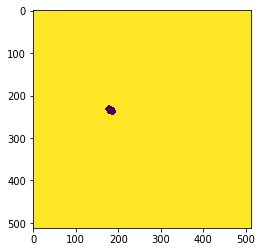

26.8755
Found 1 images


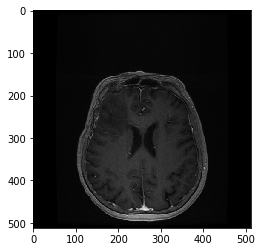

Area of poly: 93.0


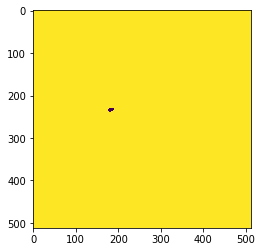

new trumor!
2.8755
Found 1 images


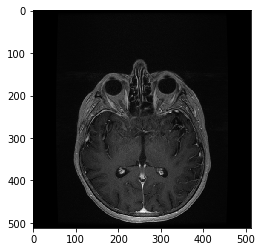

Area of poly: 4.5


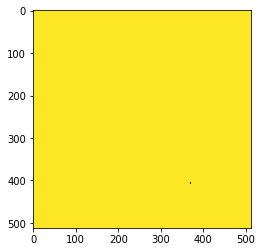

4.8755
Found 1 images


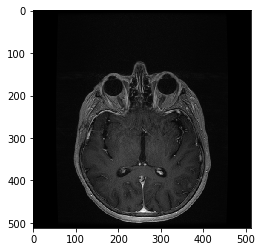

Area of poly: 134.5


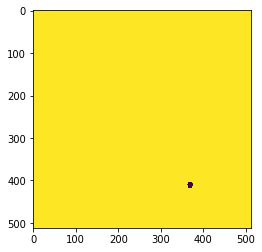

6.8755
Found 1 images


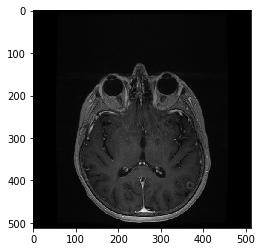

Area of poly: 278.5


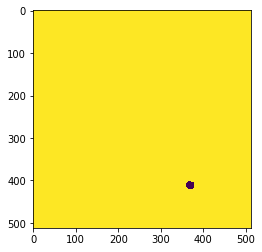

8.8755
Found 1 images


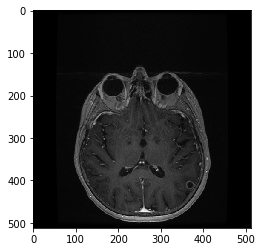

Area of poly: 331.0


KeyboardInterrupt: 

In [9]:
val_files_number = 0
for number_of_data in ok_data:
    print(number_of_data)
    scan_type = 'MR'
    PATH_TO_FOLDER = "dataset/new_data/{}/".format(number_of_data)

    for i in os.listdir(PATH_TO_FOLDER):
        if ('RS' in i) and ('MR' in i):
            meta_data_file = i
            print(meta_data_file)
            break

    frames_data = []
    for i in range(1,400):
        try:
            _path_to_file = PATH_TO_FOLDER + "{}.{}.Image {}.dcm".format(scan_type, number_of_data, i)
            ds = pydicom.dcmread(_path_to_file)

            frames_data.append(
                {
                    "frame": ds.pixel_array,
                    "z_index": ds.ImagePositionPatient[2],
                    # this is the center of the upper left voxel
                    "origin_x": float(ds.ImagePositionPatient[0]),
                    "origin_y": float(ds.ImagePositionPatient[1]),
                    "Time": ds.StudyDate,
                    "x_spacing": float(ds.PixelSpacing[0]), 
                    "y_spacing": float(ds.PixelSpacing[1]),
                }
            )
        except OSError as e:
            pass

    slices_df = pd.DataFrame(frames_data)

    meta_ds = pydicom.dcmread(PATH_TO_FOLDER + meta_data_file)
    for tumors in meta_ds.ROIContourSequence:
        print('new trumor!')
        for tumor in tumors.ContourSequence:
            cancer_poly = tumor.ContourData
            z = cancer_poly[2]
            print(z)
            frames = slices_df[(slices_df['z_index'] >= z - 0.999) & (slices_df['z_index'] <= z + 0.999)]
            print("Found {} images".format(len(frames)))
            _out_files_name = str("{}_{}".format(number_of_data, z))
            img = frames.iloc[0].frame
            origin_x = frames.iloc[0].origin_x
            origin_y = frames.iloc[0].origin_y
            x_spacing = frames.iloc[0].x_spacing
            y_spacing = frames.iloc[0].y_spacing
            plt.imshow(img, cmap='gray')
            plt.show()
            poly = list(zip(cancer_poly[0::3], cancer_poly[1::3]))
            #print(cancer_poly)



            brain_image = Image.fromarray(img).point(lambda i:i*(1./256)).convert('L').convert('RGBA')

            poly = [(np.ceil((x - origin_x) / x_spacing), np.ceil((y - origin_y) / y_spacing)) for x, y in poly]
            poly_area = PolygonArea(poly)
            print("Area of poly: {}".format(poly_area))

            #print(poly)
            #plt.imshow(brain_image,cmap='gray')
            #plt.show()
            img2 = Image.new("RGB", (512,512), 'white')
            draw = ImageDraw.Draw(img2)
            draw.polygon(poly, fill = "black")
            img2 = cv2.cvtColor(np.array(img2), cv2.COLOR_RGB2GRAY)

            #img3 = Image.blend(brain_image, img2, 1.0)
            #plt.figure(figsize=(10,10))
            plt.imshow(img2)
            plt.show()
            if poly_area > 100:
                cv2.imwrite('anno/{}.png'.format(_out_files_name), img2)
                img = (img*(255./img.max())).astype('uint8')
                cv2.imwrite('data/{}.png'.format(_out_files_name), img)
                cv2.imwrite('validation/{}.png'.format(val_files_number), img)
                val_files_number += 1


In [152]:
img.max()

25656

In [113]:
!open .

In [110]:
!mkdir anno

In [111]:
!mkdir data

In [109]:
import time



'1540093301_9210198'

In [67]:
import dicom_contour.contour as dcm

In [ ]:
dcm.get_contour_dict()

In [ ]:
dcm.get_data()

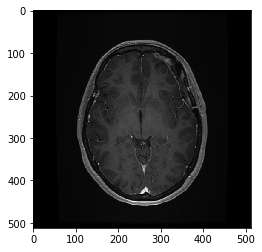

In [11]:
plt.imshow(img, cmap='gray')


In [16]:
kernel = np.ones((5,5),np.uint8)
erosion = cv2.erode(img,kernel,iterations = 1)

In [56]:
oopl = Image.fromarray(img).point(lambda i:i*(1./256)).convert('L').convert('RGB').copy()

In [59]:
img = np.array(oopl)
cimg = cv2.cvtColor(img,cv2.COLOR_RGB2GRAY)

In [62]:
equ = cv2.equalizeHist(cimg)
res = np.hstack((img,equ)) #stacking images side-by-side
plt.imshow(res)

error: OpenCV(3.4.3) /tmp/opencv-20181001-83194-s618mv/opencv-3.4.3/modules/imgproc/src/histogram.cpp:3334: error: (-215:Assertion failed) _src.type() == CV_8UC1 in function 'equalizeHist'


In [46]:
img = cv2.medianBlur(oopl, 20)
plt.imshow(img)

error: OpenCV(3.4.3) /tmp/opencv-20181001-83194-s618mv/opencv-3.4.3/modules/imgproc/src/smooth.cpp:5181: error: (-215:Assertion failed) (ksize % 2 == 1) && (_src0.dims() <= 2 ) in function 'medianBlur'


In [49]:
oopl.shape

(512, 512)

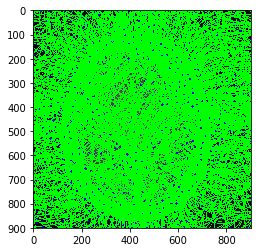

In [52]:
import cv2
import numpy as np

img = cv2.imread('/Users/totruok/Downloads/head_cancer.png',0)
img = cv2.medianBlur(img,5)
cimg = cv2.cvtColor(img,cv2.COLOR_GRAY2BGR)

circles = cv2.HoughCircles(img,cv2.HOUGH_GRADIENT,1,20,
                            param1=50,param2=30,minRadius=0,maxRadius=0)

circles = np.uint16(np.around(circles))
for i in circles[0,:]:
    # draw the outer circle
    cv2.circle(cimg,(i[0],i[1]),i[2],(0,255,0),2)
    # draw the center of the circle
    cv2.circle(cimg,(i[0],i[1]),2,(0,0,255),3)

plt.imshow(cimg)
#cv2.waitKey(0)
#cv2.destroyAllWindows()

In [50]:
circles = cv2.HoughCircles(oopl,cv2.HOUGH_GRADIENT,1,120, param1=100,param2=30,minRadius=0,maxRadius=0)

error: OpenCV(3.4.3) /tmp/opencv-20181001-83194-s618mv/opencv-3.4.3/modules/imgproc/src/hough.cpp:1736: error: (-215:Assertion failed) !_image.empty() && _image.type() == CV_8UC1 && (_image.isMat() || _image.isUMat()) in function 'HoughCircles'


In [48]:
img = cv2.medianBlur(oopl, 5)
cimg = cv2.cvtColor(img,cv2.COLOR_GRAY2BGR)

circles = cv2.HoughCircles(cimg,cv2.HOUGH_GRADIENT,1,120, param1=100,param2=30,minRadius=0,maxRadius=0)

circles = np.uint16(np.around(circles))

for i in circles[0,:]:
   # draw the outer circle
   cv2.circle(planets,(i[0],i[1]),i[2],(0,255,0),2)
   # draw the center of the circle
   cv2.circle(planets,(i[0],i[1]),2,(0,0,255),3)

error: OpenCV(3.4.3) /tmp/opencv-20181001-83194-s618mv/opencv-3.4.3/modules/imgproc/src/hough.cpp:1736: error: (-215:Assertion failed) !_image.empty() && _image.type() == CV_8UC1 && (_image.isMat() || _image.isUMat()) in function 'HoughCircles'


In [37]:
cv2.findContours(binary, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)

error: OpenCV(3.4.3) /tmp/opencv-20181001-83194-s618mv/opencv-3.4.3/modules/imgproc/src/contours.cpp:199: error: (-210:Unsupported format or combination of formats) [Start]FindContours supports only CV_8UC1 images when mode != CV_RETR_FLOODFILL otherwise supports CV_32SC1 images only in function 'cvStartFindContours_Impl'


In [36]:
binary = cv2.bitwise_not(y)
(_,contours,_) = cv2.findContours(binary, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)

for contour in contours:
    (x,y,w,h) = cv2.boundingRect(contour)
    cv2.rectangle(oopl, (x,y), (x+w,y+h), (0,255,0), 2)

error: OpenCV(3.4.3) /tmp/opencv-20181001-83194-s618mv/opencv-3.4.3/modules/imgproc/src/contours.cpp:199: error: (-210:Unsupported format or combination of formats) [Start]FindContours supports only CV_8UC1 images when mode != CV_RETR_FLOODFILL otherwise supports CV_32SC1 images only in function 'cvStartFindContours_Impl'


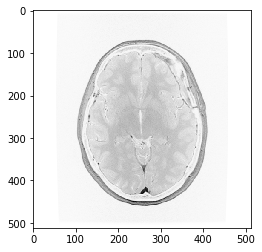

In [35]:
plt.imshow(binary,cmap='gray')

In [ ]:


(_,contours,_) = cv2.findContours(binary, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)

for contour in contours:
    (x,y,w,h) = cv2.boundingRect(contour)
    cv2.rectangle(img, (x,y), (x+w,y+h), (0,255,0), 2)

In [ ]:
mask = cv2.inRange(hsv, lower_red, upper_red)
res = cv2.bitwise_and(frame,frame, mask= mask)

kernel = np.ones((5,5),np.uint8)
erosion = cv2.erode(mask,kernel,iterations = 1)
dilation = cv2.dilate(mask,kernel,iterations = 1)

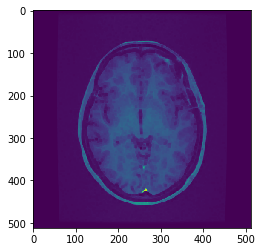

In [18]:
plt.imshow(erosion)

In [48]:
img.shape

(512, 512)

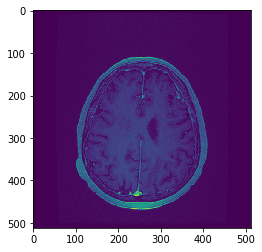

In [9]:
plt.imshow(img)

In [17]:
_t = Image.fromarray(img).point(lambda i:i*(1./256)).convert('L')

512

In [242]:
meta_ds

(0008, 0005) Specific Character Set              CS: 'ISO_IR 192'
(0008, 0012) Instance Creation Date              DA: '20181011'
(0008, 0013) Instance Creation Time              TM: '071037'
(0008, 0016) SOP Class UID                       UI: RT Structure Set Storage
(0008, 0018) SOP Instance UID                    UI: 1.2.246.352.205.4971079194157331858.986110463187587226
(0008, 0020) Study Date                          DA: '20170426'
(0008, 0030) Study Time                          TM: '151151'
(0008, 0050) Accession Number                    SH: '13421975'
(0008, 0060) Modality                            CS: 'RTSTRUCT'
(0008, 0070) Manufacturer                        LO: 'Varian Medical Systems'
(0008, 0090) Referring Physician's Name          PN: 'Dr. Pintér Tamás'
(0008, 1010) Station Name                        SH: 'variancombo'
(0008, 1030) Study Description                   LO: 'Koponya'
(0008, 103e) Series Description                  LO: 'Contouring'
(0008, 1048) Physician

In [240]:
slices_df[]

,Time,frame,image_position_xy,z_index
0,20170426,"[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,...","[-130.04115443, -87.86088425]",115.061879
1,20170426,"[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,...","[-129.91114314, -88.10590553]",113.081207
2,20170426,"[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,...","[-129.78113185, -88.35092681]",111.100535
3,20170426,"[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,...","[-129.65112056, -88.59594809]",109.119863
4,20170426,"[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,...","[-129.52110927, -88.84096937]",107.139191
5,20170426,"[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,...","[-129.39109798, -89.08599065]",105.158518
6,20170426,"[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,...","[-129.26108669, -89.33101192]",103.177846
7,20170426,"[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,...","[-129.1310754, -89.5760332]",101.197174
8,20170426,"[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,...","[-129.0010641, -89.82105448]",99.216502
9,20170426,"[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,...","[-128.87105281, -90.06607576]",97.235830


In [239]:
[(int(i[0]) - 100000, int(i[1]) - 100000) for i in poly]

[(-99988, -100030),
 (-99987, -100030),
 (-99987, -100031),
 (-99986, -100030),
 (-99985, -100030),
 (-99985, -100030),
 (-99984, -100029),
 (-99984, -100028),
 (-99983, -100028),
 (-99983, -100028),
 (-99982, -100028),
 (-99981, -100028),
 (-99981, -100027),
 (-99980, -100027),
 (-99981, -100026),
 (-99982, -100026),
 (-99982, -100026),
 (-99983, -100026),
 (-99983, -100025),
 (-99984, -100026),
 (-99985, -100026),
 (-99985, -100026),
 (-99986, -100026),
 (-99987, -100026),
 (-99987, -100027),
 (-99988, -100027),
 (-99988, -100027),
 (-99989, -100028),
 (-99989, -100029),
 (-99989, -100030)]

In [217]:
slices_df = pd.DataFrame(frames_data)

In [228]:
slices_df[(slices_df['z_index'] >= 40.5) & (slices_df['z_index'] <= 43.5)].iloc[0]

Time                                                20170426
frame      [[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,...
z_index                                               41.777
Name: 37, dtype: object

In [203]:
meta_ds.ROIContourSequence[0].ContourSequence[1].ContourDatafor i in range(1,300):
    try:
        _path_to_file = PATH_TO_FOLDER + "{}.{}.Image {}.dcm".format(scan_type, number_of_data, i)
        ds = pydicom.dcmread(_path_to_file)
        print(ds.ImagePositionPatient[2])
    except OSError as e:
        pass

['12.8791404634567', '-31.297281211818', '48.7823364253992', '13.798321955524', '-31.623903026457', '48.8830766105865', '14.7350520123165', '-31.617821260573', '48.9438112096791', '15.1413425719571', '-31.371379309671', '48.9399937366512', '15.7132350779101', '-30.825831093199', '48.9100450938447', '16.0794053922884', '-30.481148872274', '48.8914412043483', '16.7044529097991', '-29.786714537673', '48.846563529857', '17.008789431024', '-29.590534874955', '48.8422715481998', '17.6695283463617', '-29.243232164473', '48.8426789678652', '18.6292812303977', '-28.800660168326', '48.8509282662023', '19.5656550952293', '-28.801331452767', '48.9124748786065', '19.8591539546229', '-28.784818869023', '48.9296974326794', '20.5085342560506', '-28.678668703798', '48.9591913221132', '21.4591621541496', '-28.409097493811', '48.988242914896', '21.9338472915933', '-27.944821970474', '48.9619675121302', '21.5102329131462', '-27.440845978982', '48.8718165473866', '21.2651339070334', '-26.983579842183', '48

In [44]:
_t = list(os.walk('dataset/339663/'))[0][2]
sorted(_t, key=get_image_number)

CT.339663.Image 28.dcm
MR.339663.Image 72.dcm
MR.339663.Image 66.dcm
MR.339663.Image 9.dcm
MR.339663.Image 8.dcm
MR.339663.Image 67.dcm
CT.339663.Image 29.dcm
MR.339663.Image 73.dcm
MR.339663.Image 59.dcm
MR.339663.Image 65.dcm
MR.339663.Image 71.dcm
MR.339663.Image 70.dcm
MR.339663.Image 64.dcm
MR.339663.Image 58.dcm
MR.339663.Image 60.dcm
MR.339663.Image 74.dcm
MR.339663.Image 48.dcm
MR.339663.Image 49.dcm
MR.339663.Image 75.dcm
MR.339663.Image 61.dcm
MR.339663.Image 77.dcm
CT.339663.Image 39.dcm
MR.339663.Image 63.dcm
RS.339663.MR_1.dcm


ValueError: invalid literal for int() with base 10: 'RS'

In [128]:
cancer = pydicom.dcmread('dataset/339663/RS.339663.Plan_1.dcm')
#ds

In [183]:
cancer

(0008, 0005) Specific Character Set              CS: 'ISO_IR 192'
(0008, 0012) Instance Creation Date              DA: '20181011'
(0008, 0013) Instance Creation Time              TM: '071037'
(0008, 0016) SOP Class UID                       UI: RT Structure Set Storage
(0008, 0018) SOP Instance UID                    UI: 1.2.246.352.205.5487033666004090757.3610599632798155195
(0008, 0020) Study Date                          DA: '20170601'
(0008, 0030) Study Time                          TM: '114405.677'
(0008, 0050) Accession Number                    SH: ''
(0008, 0060) Modality                            CS: 'RTSTRUCT'
(0008, 0070) Manufacturer                        LO: 'Varian Medical Systems'
(0008, 0090) Referring Physician's Name          PN: ''
(0008, 1010) Station Name                        SH: 'variancombo'
(0008, 1030) Study Description                   LO: 'Head^Stereo (Adult)'
(0008, 103e) Series Description                  LO: 'ARIA RadOnc Structure Sets'
(0008, 1048) 

In [162]:
cancer_poly = cancer.ROIContourSequence[0].ContourSequence[0].ContourData

In [167]:
cancer_poly

['13.4765625', '-334.85763302365', '1072', '14.6484375', '-334.94221698113', '1072', '15.8203125', '-334.95053680982', '1072', '16.2491945876289', '-334.6953125', '1072', '16.9921875', '-334.294921875', '1072', '17.6177153716216', '-333.5234375', '1072', '17.7558273565574', '-332.3515625', '1072', '16.9921875', '-331.25551470588', '1072', '16.8225740131579', '-331.1796875', '1072', '15.8203125', '-330.71522484756', '1072', '15.1017099056604', '-331.1796875', '1072', '14.6484375', '-331.37342489919', '1072', '13.4765625', '-331.76068037975', '1072', '12.6853813559322', '-332.3515625', '1072', '12.6818068484043', '-333.5234375', '1072', '13.0145733173077', '-334.6953125', '1072']

In [235]:
_t = list(zip(cancer_poly[0::3], cancer_poly[1::3]))

In [236]:
[int()_t

[("-17.790593038643", "58.216045706607"),
 ("-16.879253058296", "57.7407565184864"),
 ("-15.934670235055", "57.8957190364688"),
 ("-15.487353191839", "58.1263014040982"),
 ("-14.953465010365", "58.7450063770318"),
 ("-14.742810662277", "59.0250844968232"),
 ("-14.347553214628", "59.9393042908108"),
 ("-14.089964579562", "60.8596083765218"),
 ("-14.227567547711", "61.7973780083902"),
 ("-14.742562673407", "62.7435078924256"),
 ("-14.749311320171", "62.7521247948694"),
 ("-15.140544712165", "63.7011036574972"),
 ("-15.196894126642", "64.6352822776119"),
 ("-15.201754696223", "65.5671853412882"),
 ("-15.450680418159", "66.5098748972613"),
 ("-15.478442208647", "66.5453550778237"),
 ("-15.529937870732", "66.513377691058"),
 ("-16.440762260674", "66.0541120937128"),
 ("-16.876928414132", "65.6412198694864"),
 ("-17.434889604883", "64.959834037433"),
 ("-17.627770908802", "64.7427152045682"),
 ("-18.42153737848", "64.0073613061123"),
 ("-18.593816815319", "63.853721483436"),
 ("-19.403170396

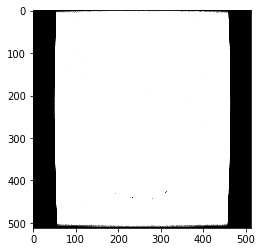

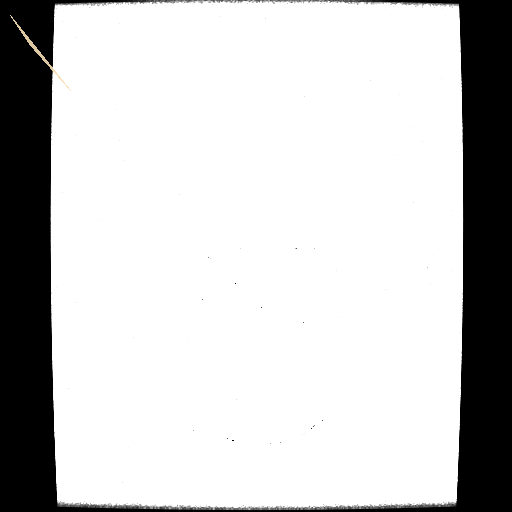

In [261]:
brain_image = ds.pixel_array
brain_image = Image.fromarray(brain_image).convert('RGBA')
plt.imshow(brain_image)
plt.show()
x = ['10', '30', '70']
y = ['15', '45', '90']

# convert values to ints
x = map(int, x)
y = map(int, y)

img2 = brain_image.copy()
draw = ImageDraw.Draw(img2)
draw.polygon(list(zip(x,y)), fill = "wheat")

img3 = Image.blend(brain_image, img2, 0.9)
#img3.save('/tmp/out.png')
img3

In [173]:
draw

In [158]:
zip(x,y)

In [139]:
dir(cancer.ROIContourSequence[0].ContourSequence[0])

['ContourData',
 'ContourGeometricType',
 'ContourImageSequence',
 'NumberOfContourPoints',
 '__contains__',
 '__delattr__',
 '__delitem__',
 '__dir__',
 '__enter__',
 '__eq__',
 '__exit__',
 '__format__',
 '__ge__',
 '__getattr__',
 '__getattribute__',
 '__getitem__',
 '__gt__',
 '__init__',
 '__init_subclass__',
 '__iter__',
 '__le__',
 '__len__',
 '__lt__',
 '__ne__',
 '__new__',
 '__reduce__',
 '__reduce_ex__',
 '__repr__',
 '__setattr__',
 '__setitem__',
 '__sizeof__',
 '__str__',
 '__subclasshook__',
 '__weakref__',
 '_character_set',
 '_dataset_slice',
 '_pretty_str',
 '_slice_dataset',
 'add',
 'add_new',
 'clear',
 'convert_pixel_data',
 'copy',
 'data_element',
 'decode',
 'decompress',
 'dir',
 'elements',
 'ensure_file_meta',
 'fix_meta_info',
 'formatted_lines',
 'fromkeys',
 'get',
 'get_item',
 'group_dataset',
 'is_original_encoding',
 'items',
 'iterall',
 'keys',
 'pixel_array',
 'pop',
 'popitem',
 'remove_private_tags',
 'save_as',
 'set_original_encoding',
 'setdef

In [40]:
ds = pydicom.dcmread('dataset/361113/RS.361113.MR_0809.dcm')
dir(ds)
ds

(0008, 0005) Specific Character Set              CS: 'ISO_IR 192'
(0008, 0012) Instance Creation Date              DA: '20181018'
(0008, 0013) Instance Creation Time              TM: '070329'
(0008, 0016) SOP Class UID                       UI: RT Structure Set Storage
(0008, 0018) SOP Instance UID                    UI: 1.2.246.352.205.4810536754681266937.425154471525754761
(0008, 0020) Study Date                          DA: '20170809'
(0008, 0030) Study Time                          TM: '101946'
(0008, 0050) Accession Number                    SH: '13844947'
(0008, 0060) Modality                            CS: 'RTSTRUCT'
(0008, 0070) Manufacturer                        LO: 'Varian Medical Systems'
(0008, 0090) Referring Physician's Name          PN: 'Dr. Bajcsay András'
(0008, 1010) Station Name                        SH: 'variancombo'
(0008, 1030) Study Description                   LO: 'Vizsgálat'
(0008, 103e) Series Description                  LO: 'Contouring'
(0008, 1090) Manuf

In [35]:
dir(ds)

['AccessionNumber',
 'AcquisitionDate',
 'AcquisitionTime',
 'BitsAllocated',
 'BitsStored',
 'BodyPartExamined',
 'Columns',
 'ContentDate',
 'ContentTime',
 'ContrastBolusAgent',
 'ContrastBolusRoute',
 'DeviceSerialNumber',
 'EchoTime',
 'EchoTrainLength',
 'FrameOfReferenceUID',
 'HighBit',
 'ImageOrientationPatient',
 'ImagePositionPatient',
 'ImageType',
 'InstanceCreationDate',
 'InstanceCreationTime',
 'InstanceNumber',
 'InstitutionName',
 'Manufacturer',
 'Modality',
 'OtherPatientIDs',
 'PatientBirthDate',
 'PatientBirthTime',
 'PatientID',
 'PatientName',
 'PatientPosition',
 'PatientSex',
 'PhotometricInterpretation',
 'PixelData',
 'PixelRepresentation',
 'PixelSpacing',
 'PositionReferenceIndicator',
 'ReferringPhysicianName',
 'Rows',
 'SOPClassUID',
 'SOPInstanceUID',
 'SamplesPerPixel',
 'ScanOptions',
 'ScanningSequence',
 'SequenceVariant',
 'SeriesDate',
 'SeriesDescription',
 'SeriesInstanceUID',
 'SeriesNumber',
 'SeriesTime',
 'SliceLocation',
 'SliceThickness',

In [111]:
dir(ds)

['AccessionNumber',
 'AcquisitionDate',
 'AcquisitionNumber',
 'AcquisitionTime',
 'BitsAllocated',
 'BitsStored',
 'BodyPartExamined',
 'Columns',
 'ContentDate',
 'ContentTime',
 'ConvolutionKernel',
 'DataCollectionDiameter',
 'DeviceSerialNumber',
 'DistanceSourceToDetector',
 'DistanceSourceToPatient',
 'Exposure',
 'ExposureTime',
 'FilterType',
 'FocalSpots',
 'FrameOfReferenceUID',
 'GantryDetectorTilt',
 'GeneratorPower',
 'HighBit',
 'ImageComments',
 'ImageOrientationPatient',
 'ImagePositionPatient',
 'ImageType',
 'InstanceCreationDate',
 'InstanceCreationTime',
 'InstanceNumber',
 'InstitutionName',
 'IrradiationEventUID',
 'KVP',
 'Manufacturer',
 'ManufacturerModelName',
 'Modality',
 'OtherPatientIDs',
 'PatientBirthDate',
 'PatientBirthTime',
 'PatientID',
 'PatientName',
 'PatientPosition',
 'PatientSex',
 'PhotometricInterpretation',
 'PhysiciansOfRecord',
 'PixelData',
 'PixelRepresentation',
 'PixelSpacing',
 'PositionReferenceIndicator',
 'ReconstructionDiameter'

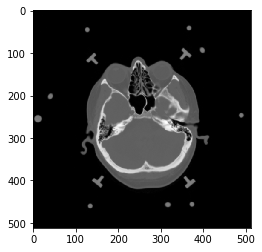

In [84]:
ds = pydicom.dcmread('dataset/339663/CT.339663.Image 36.dcm')
plt.imshow(ds.pixel_array,cmap='gray')

(0008, 0005) Specific Character Set              CS: 'ISO_IR 192'
(0008, 0008) Image Type                          CS: ['DERIVED', 'SECONDARY', 'REFORMATTED', 'AVERAGE']
(0008, 0012) Instance Creation Date              DA: '20181011'
(0008, 0013) Instance Creation Time              TM: '071007'
(0008, 0016) SOP Class UID                       UI: MR Image Storage
(0008, 0018) SOP Instance UID                    UI: 1.3.12.2.1107.5.8.2.0.20170601092419832317244170204.1856502468
(0008, 0020) Study Date                          DA: '20170426'
(0008, 0021) Series Date                         DA: '20170426'
(0008, 0022) Acquisition Date                    DA: '20170601'
(0008, 0023) Content Date                        DA: '20170426'
(0008, 0030) Study Time                          TM: '151151'
(0008, 0031) Series Time                         TM: '152833.177'
(0008, 0032) Acquisition Time                    TM: '120912.08'
(0008, 0033) Content Time                        TM: '152839.927'
(00

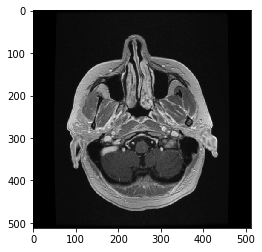

In [102]:
ds = pydicom.dcmread('dataset/339663/MR.339663.Image 68.dcm')
plt.imshow(ds.pixel_array,cmap='gray')
ds

CT.339663.Image 22.dcm


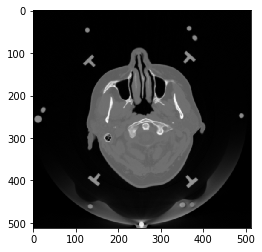

CT.339663.Image 23.dcm


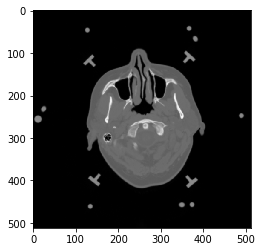

CT.339663.Image 24.dcm


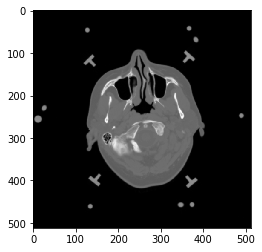

CT.339663.Image 25.dcm


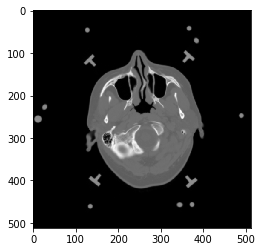

CT.339663.Image 26.dcm


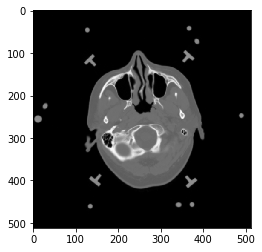

CT.339663.Image 27.dcm


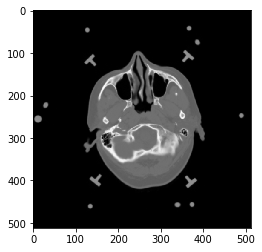

CT.339663.Image 28.dcm


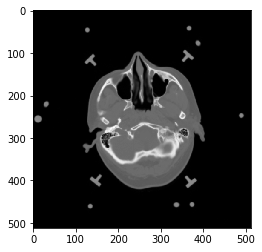

CT.339663.Image 29.dcm


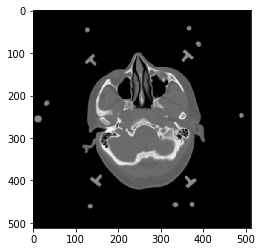

CT.339663.Image 30.dcm


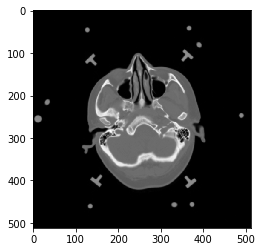

CT.339663.Image 31.dcm


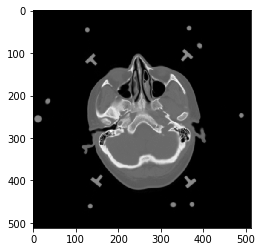

CT.339663.Image 32.dcm


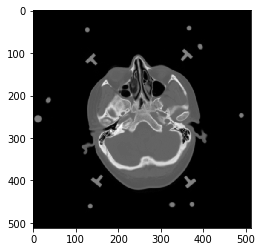

CT.339663.Image 33.dcm


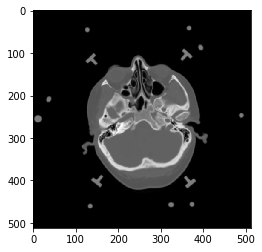

CT.339663.Image 34.dcm


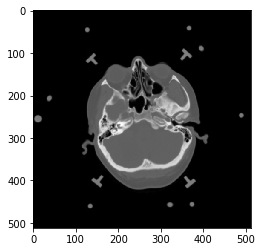

CT.339663.Image 35.dcm


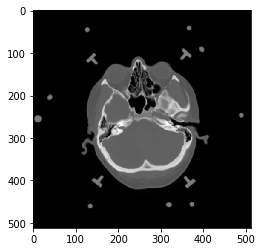

CT.339663.Image 36.dcm


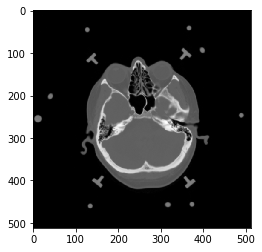

CT.339663.Image 37.dcm


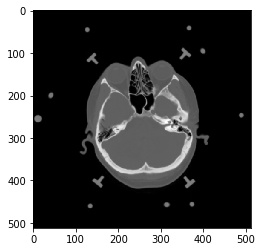

CT.339663.Image 38.dcm


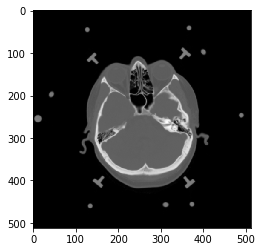

CT.339663.Image 39.dcm


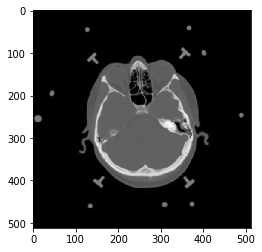

CT.339663.Image 40.dcm


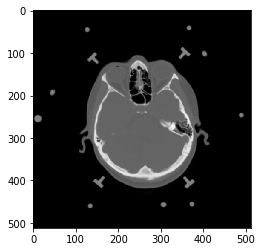

CT.339663.Image 41.dcm


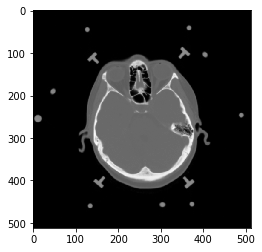

CT.339663.Image 42.dcm


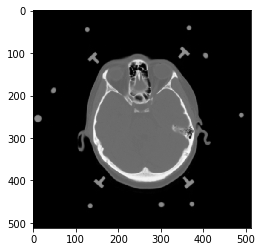

CT.339663.Image 43.dcm


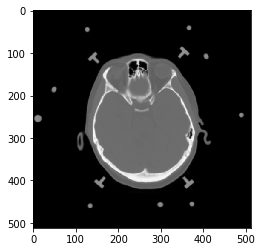

CT.339663.Image 44.dcm


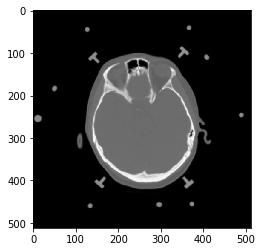

CT.339663.Image 45.dcm


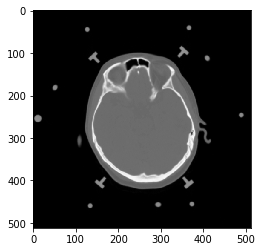

CT.339663.Image 46.dcm


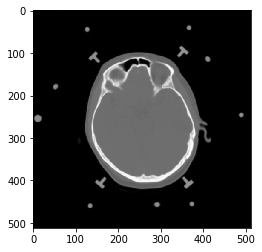

CT.339663.Image 47.dcm


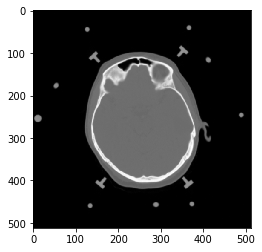

CT.339663.Image 48.dcm


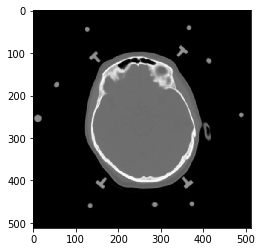

CT.339663.Image 49.dcm


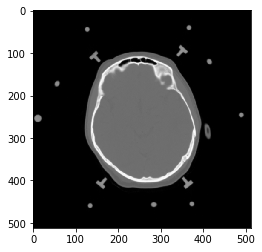

CT.339663.Image 50.dcm


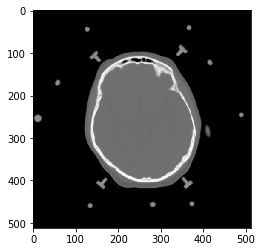

CT.339663.Image 51.dcm


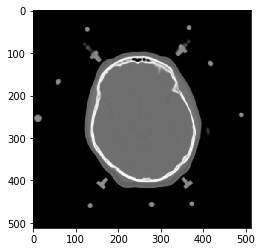

CT.339663.Image 52.dcm


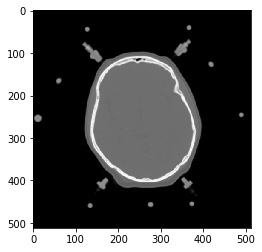

CT.339663.Image 53.dcm


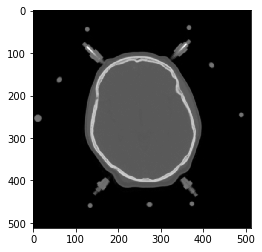

CT.339663.Image 54.dcm


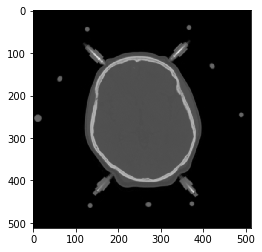

CT.339663.Image 55.dcm


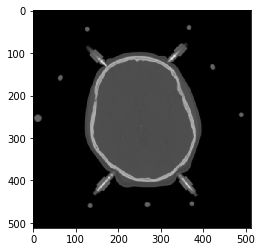

CT.339663.Image 56.dcm


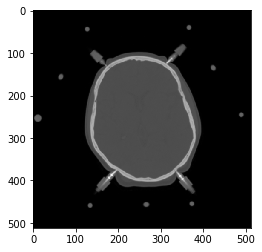

CT.339663.Image 57.dcm


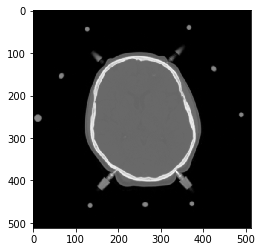

CT.339663.Image 58.dcm


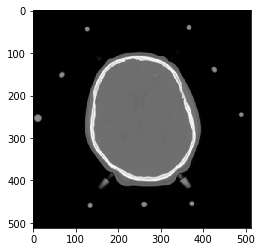

CT.339663.Image 59.dcm


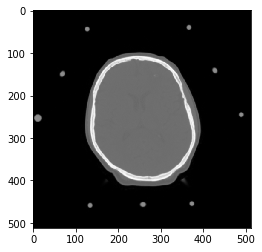

CT.339663.Image 60.dcm


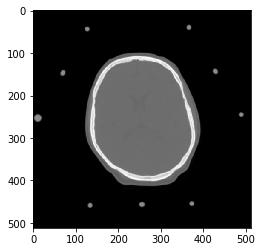

CT.339663.Image 61.dcm


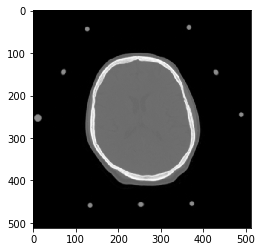

CT.339663.Image 62.dcm


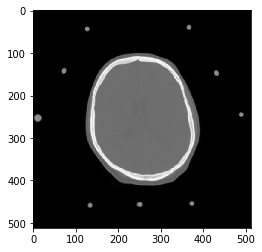

CT.339663.Image 63.dcm


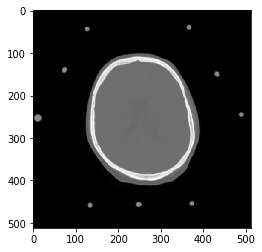

CT.339663.Image 64.dcm


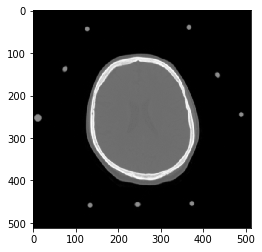

CT.339663.Image 65.dcm


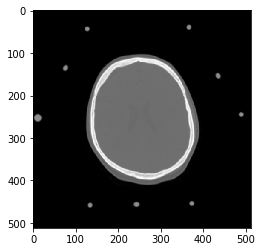

CT.339663.Image 66.dcm


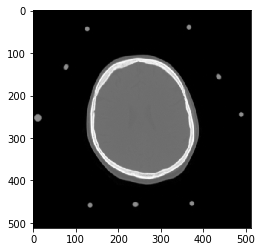

CT.339663.Image 67.dcm


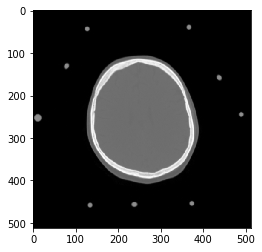

CT.339663.Image 68.dcm


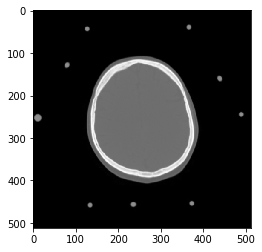

CT.339663.Image 69.dcm


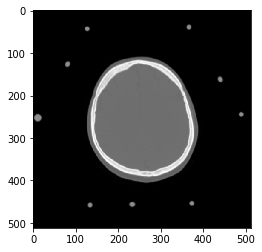

CT.339663.Image 70.dcm


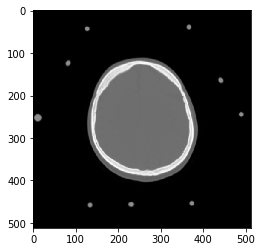

CT.339663.Image 71.dcm


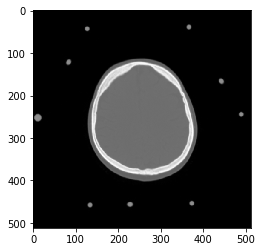

CT.339663.Image 72.dcm


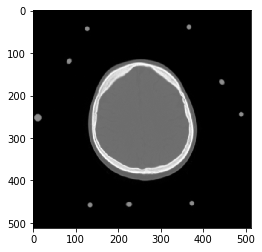

CT.339663.Image 73.dcm


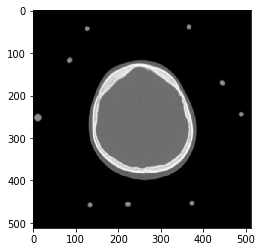

CT.339663.Image 74.dcm


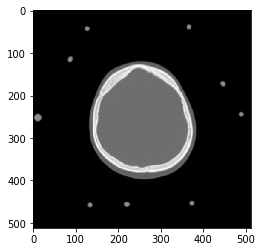

CT.339663.Image 75.dcm


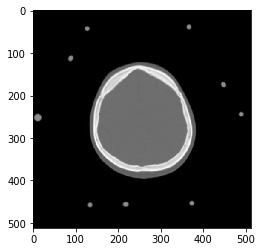

CT.339663.Image 76.dcm


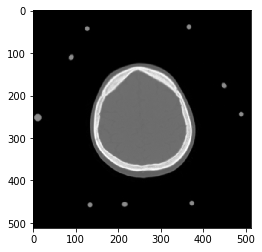

CT.339663.Image 77.dcm


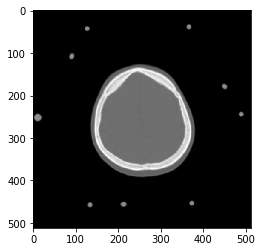

CT.339663.Image 78.dcm


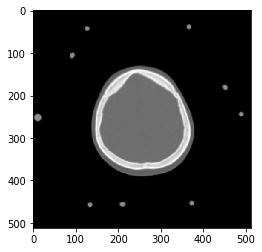

CT.339663.Image 79.dcm


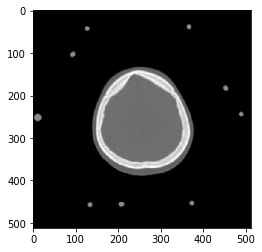

CT.339663.Image 80.dcm


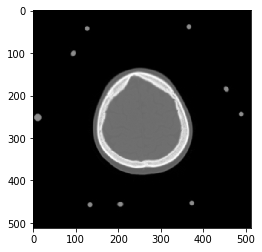

CT.339663.Image 81.dcm


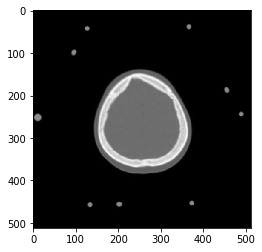

CT.339663.Image 82.dcm


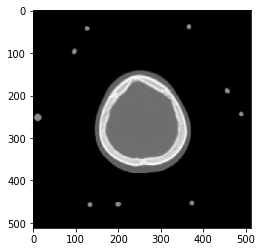

CT.339663.Image 83.dcm


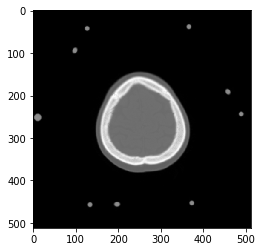

CT.339663.Image 84.dcm


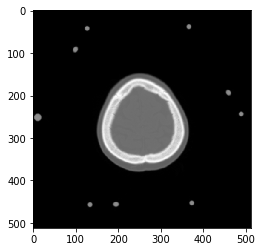

CT.339663.Image 85.dcm


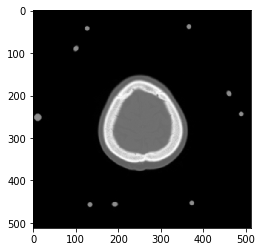

CT.339663.Image 86.dcm


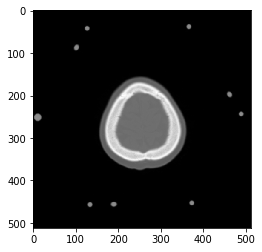

CT.339663.Image 87.dcm


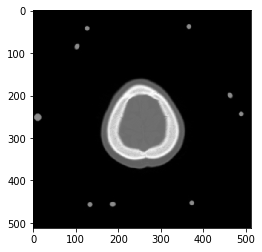

CT.339663.Image 88.dcm


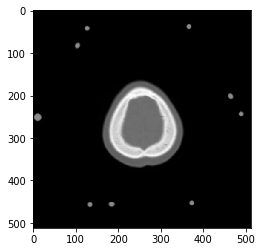

CT.339663.Image 89.dcm


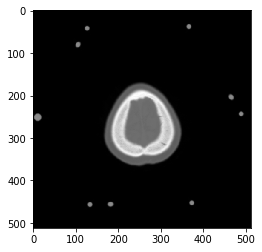

CT.339663.Image 90.dcm


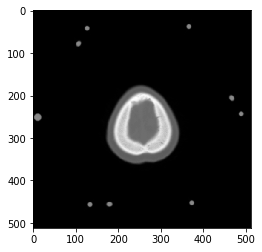

CT.339663.Image 91.dcm


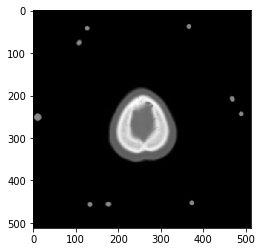

CT.339663.Image 92.dcm


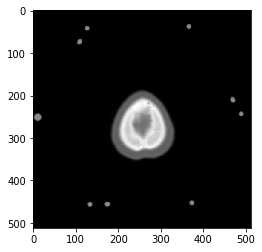

CT.339663.Image 93.dcm


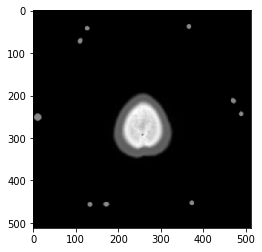

CT.339663.Image 94.dcm


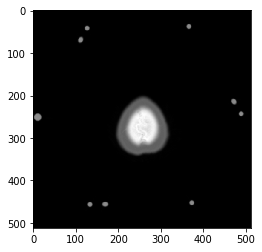

CT.339663.Image 95.dcm


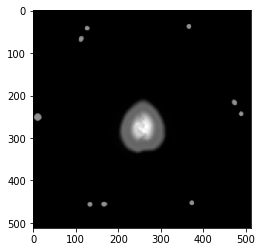

CT.339663.Image 96.dcm


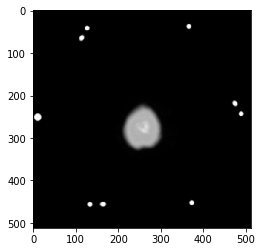

CT.339663.Image 97.dcm


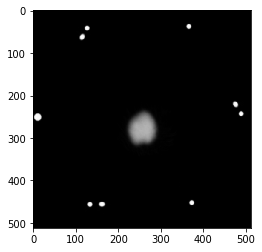

CT.339663.Image 98.dcm


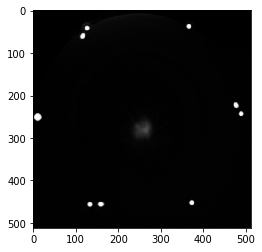

MR.339663.Image 1.dcm


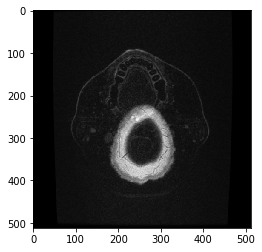

MR.339663.Image 10.dcm


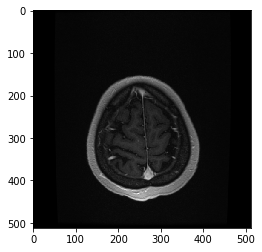

MR.339663.Image 11.dcm


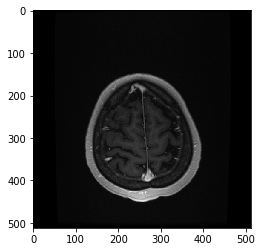

MR.339663.Image 12.dcm


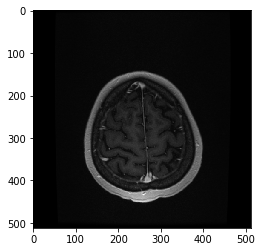

MR.339663.Image 13.dcm


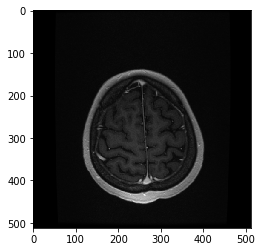

MR.339663.Image 14.dcm


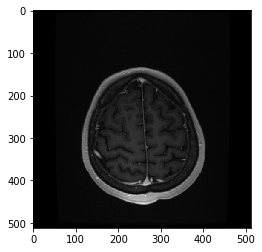

MR.339663.Image 15.dcm


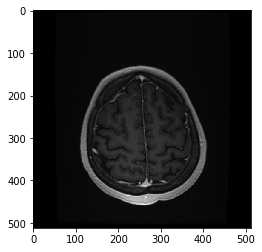

MR.339663.Image 16.dcm


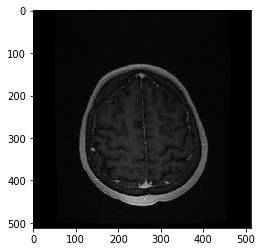

MR.339663.Image 17.dcm


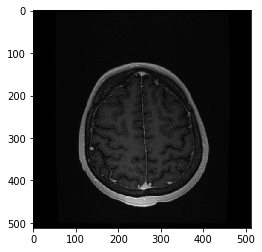

MR.339663.Image 18.dcm


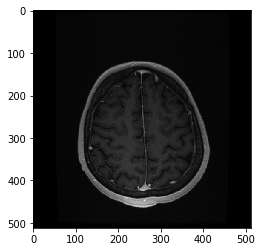

MR.339663.Image 19.dcm


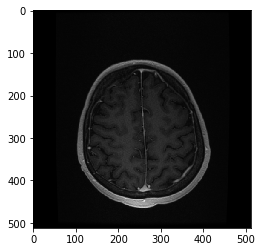

MR.339663.Image 2.dcm


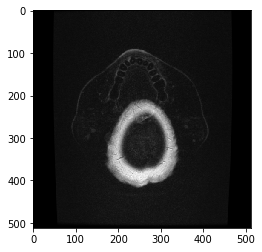

MR.339663.Image 20.dcm


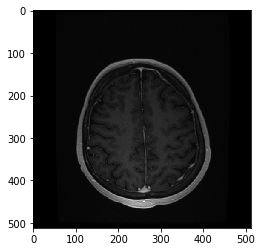

MR.339663.Image 21.dcm


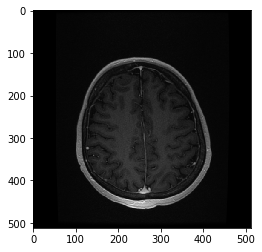

MR.339663.Image 22.dcm


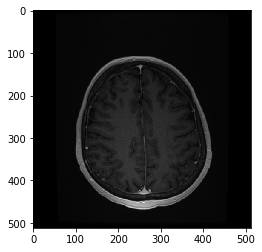

MR.339663.Image 23.dcm


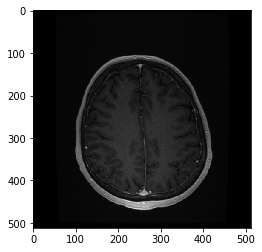

MR.339663.Image 24.dcm


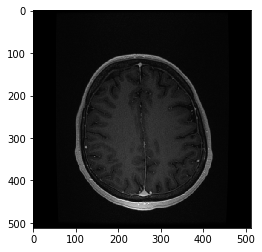

MR.339663.Image 25.dcm


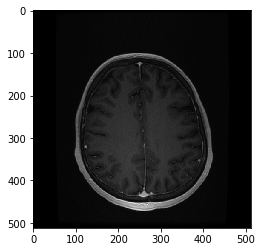

MR.339663.Image 26.dcm


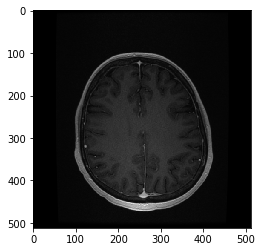

MR.339663.Image 27.dcm


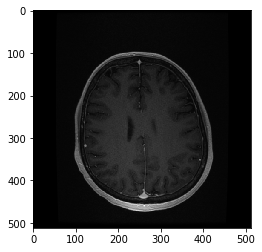

MR.339663.Image 28.dcm


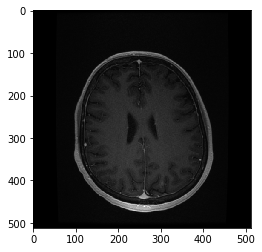

MR.339663.Image 29.dcm


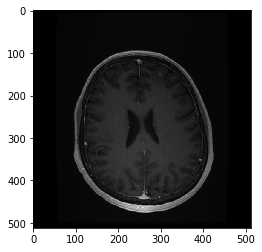

MR.339663.Image 3.dcm


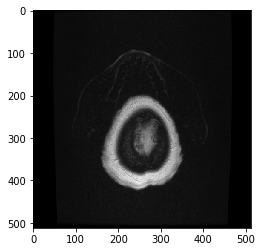

MR.339663.Image 30.dcm


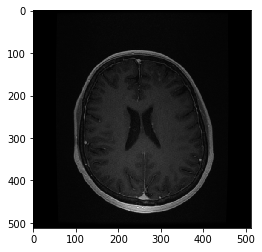

MR.339663.Image 31.dcm


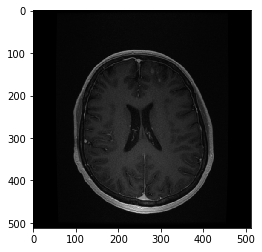

MR.339663.Image 32.dcm


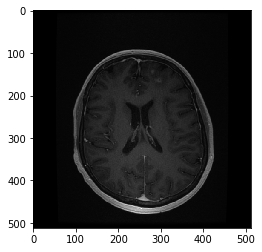

MR.339663.Image 33.dcm


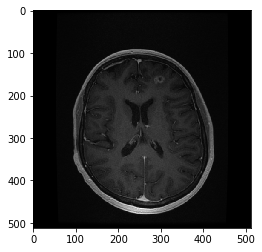

MR.339663.Image 34.dcm


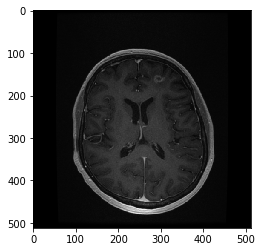

MR.339663.Image 35.dcm


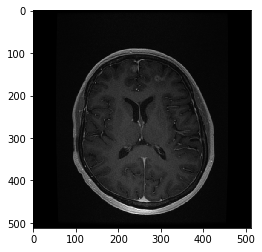

MR.339663.Image 36.dcm


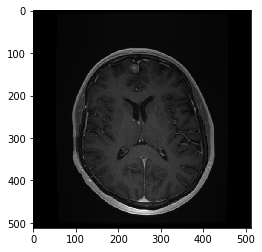

MR.339663.Image 37.dcm


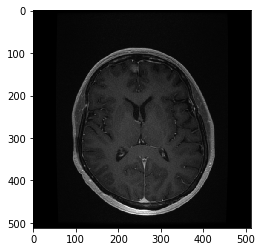

MR.339663.Image 38.dcm


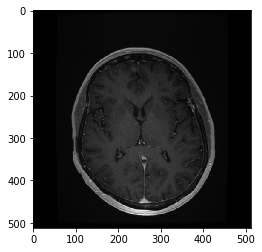

MR.339663.Image 39.dcm


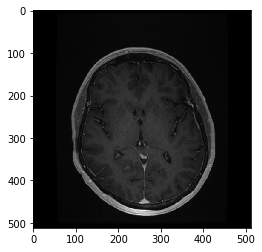

MR.339663.Image 4.dcm


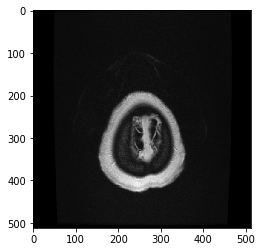

MR.339663.Image 40.dcm


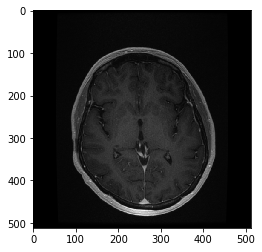

MR.339663.Image 41.dcm


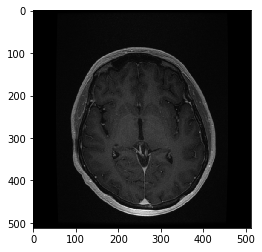

MR.339663.Image 42.dcm


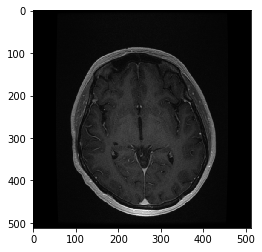

MR.339663.Image 43.dcm


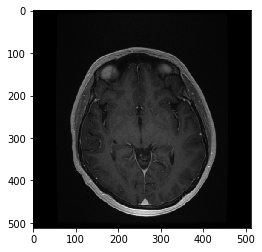

MR.339663.Image 44.dcm


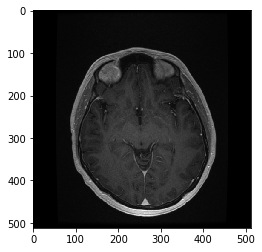

MR.339663.Image 45.dcm


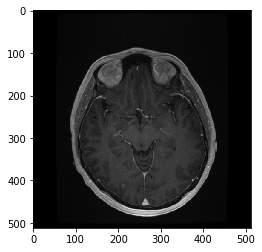

MR.339663.Image 46.dcm


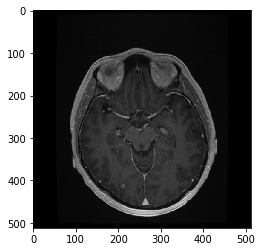

MR.339663.Image 47.dcm


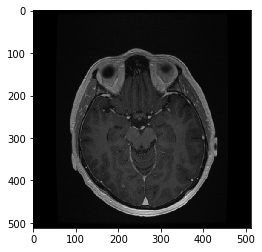

MR.339663.Image 48.dcm


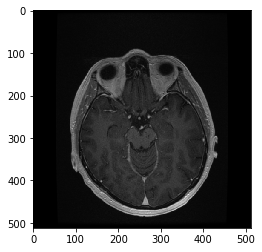

MR.339663.Image 49.dcm


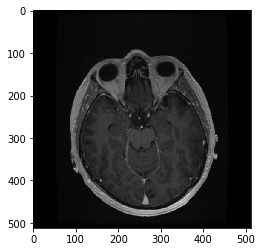

MR.339663.Image 5.dcm


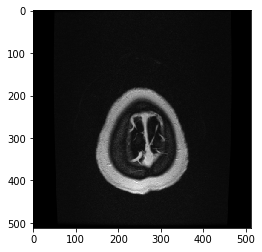

MR.339663.Image 50.dcm


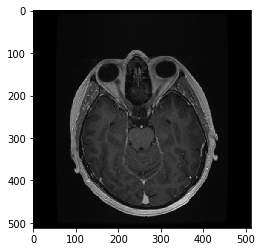

MR.339663.Image 51.dcm


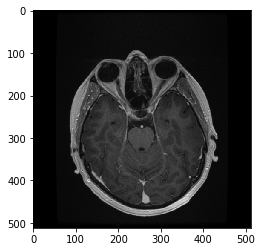

MR.339663.Image 52.dcm


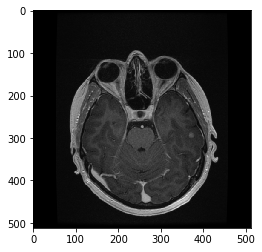

MR.339663.Image 53.dcm


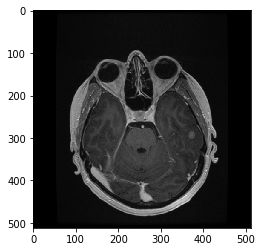

MR.339663.Image 54.dcm


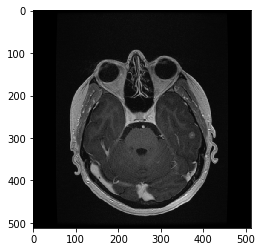

MR.339663.Image 55.dcm


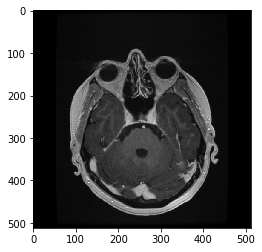

MR.339663.Image 56.dcm


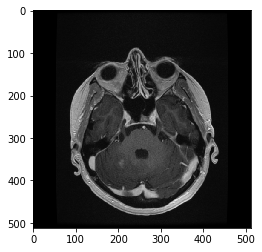

MR.339663.Image 57.dcm


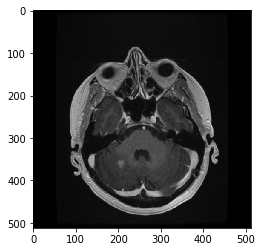

MR.339663.Image 58.dcm


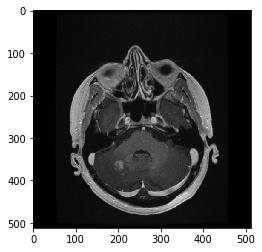

MR.339663.Image 59.dcm


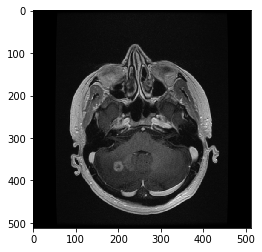

MR.339663.Image 6.dcm


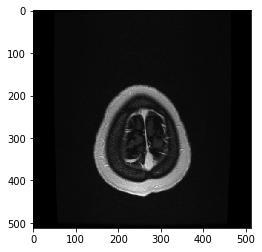

MR.339663.Image 60.dcm


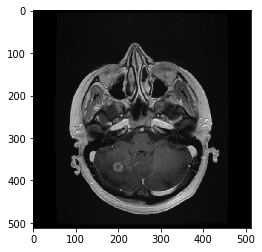

MR.339663.Image 61.dcm


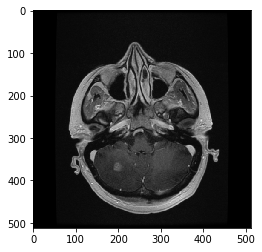

MR.339663.Image 62.dcm


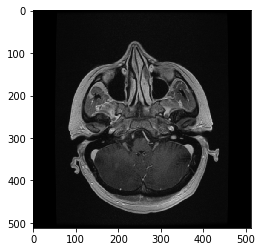

MR.339663.Image 63.dcm


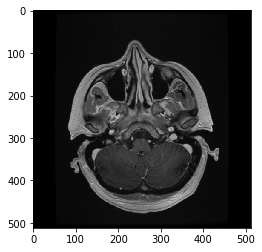

MR.339663.Image 64.dcm


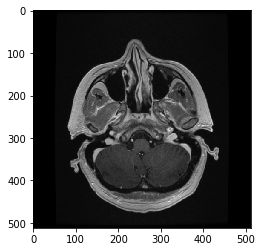

MR.339663.Image 65.dcm


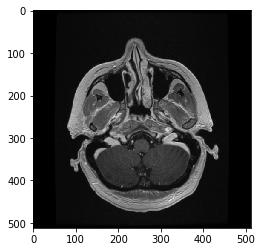

MR.339663.Image 66.dcm


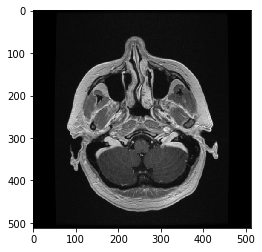

MR.339663.Image 67.dcm


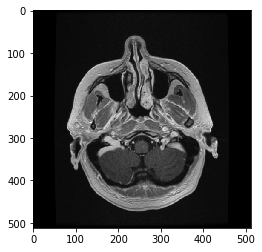

MR.339663.Image 68.dcm


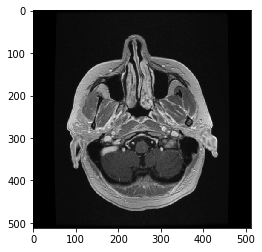

MR.339663.Image 69.dcm


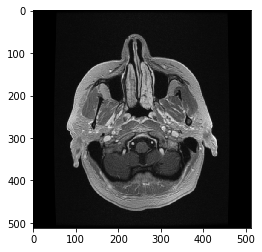

MR.339663.Image 7.dcm


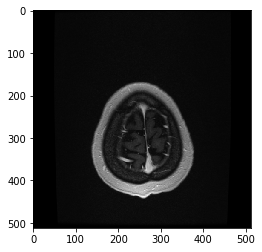

MR.339663.Image 70.dcm


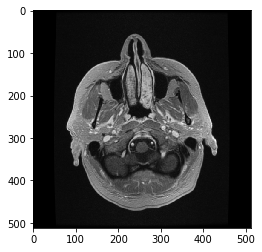

MR.339663.Image 71.dcm


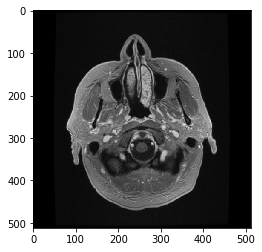

MR.339663.Image 72.dcm


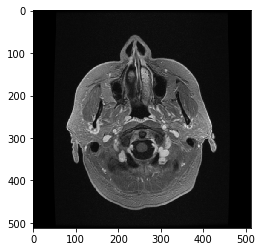

MR.339663.Image 73.dcm


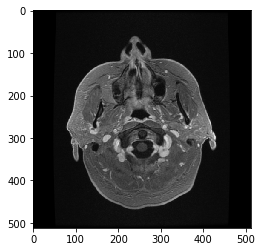

MR.339663.Image 74.dcm


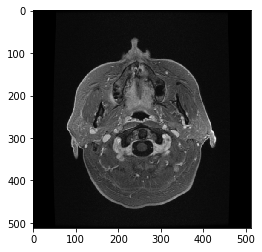

MR.339663.Image 75.dcm


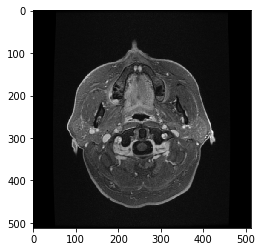

MR.339663.Image 76.dcm


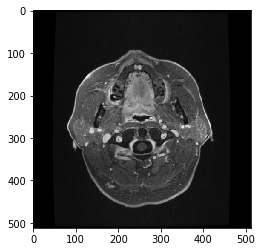

MR.339663.Image 77.dcm


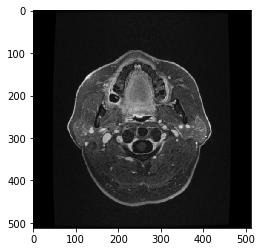

MR.339663.Image 78.dcm


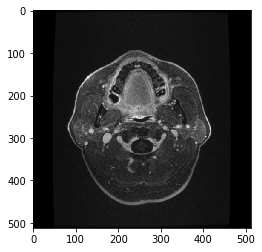

MR.339663.Image 79.dcm


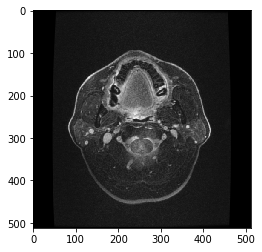

MR.339663.Image 8.dcm


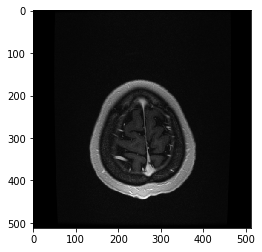

MR.339663.Image 80.dcm


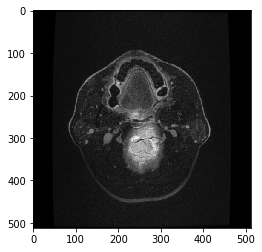

MR.339663.Image 9.dcm


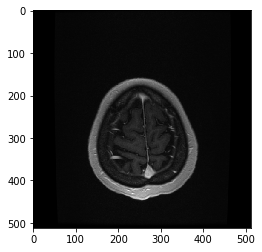

RE.339663.REGISTRATION.dcm


AttributeError: 'FileDataset' object has no attribute 'PixelData'

In [78]:
for i in sorted(list(os.walk('dataset/339663/'))[0][2]):
    print(i)
    ds = pydicom.dcmread('dataset/339663/' + i)
    plt.imshow(ds.pixel_array,cmap='gray')
    plt.show()

In [21]:
ds.PatientName

'001                  '

In [10]:
ds.dir("setup")

[]

In [22]:
ds

array([[1, 2, 1, ..., 6, 2, 3],
       [1, 2, 3, ..., 8, 2, 3],
       [2, 0, 2, ..., 4, 2, 2],
       ...,
       [0, 2, 2, ..., 5, 0, 1],
       [3, 2, 0, ..., 3, 3, 0],
       [2, 0, 3, ..., 0, 4, 4]], dtype=uint16)

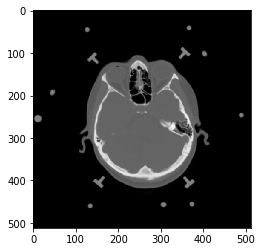

In [23]:
plt.imshow(ds.pixel_array,cmap='gray')

In [69]:
from dicom_contour.contour import *

In [71]:
! ls dataset

+-386348       -386801        -noplace354152 361113         new_data
-386661        -blank346231   -place339663   363578         new_data.zip
-386662        -no362946      -place345923   363740
-386800        -nodata351423  353891         363740.zip


In [77]:
path ='dataset/361113'

In [78]:
def get_contour_file(path):
    """
    Get contour file from a given path by searching for ROIContourSequence 
    inside dicom data structure.
    More information on ROIContourSequence available here:
    http://dicom.nema.org/medical/dicom/2016c/output/chtml/part03/sect_C.8.8.6.html
    
    Inputs:
            path (str): path of the the directory that has DICOM files in it, e.g. folder of a single patient
    Return:
        contour_file (str): name of the file with the contour
    """
    # handle `/` missing
    if path[-1] != '/': path += '/'
    # get .dcm contour file
    fpaths = [path + f for f in os.listdir(path) if '.dcm' in f]
    n = 0
    for fpath in fpaths:
        f = dicom.read_file(fpath)
        if 'ROIContourSequence' in dir(f):
            contour_file = fpath.split('/')[-1]
            n += 1
    if n > 1: warnings.warn("There are multiple files, returning the last one!")
    return contour_file

In [73]:
contour_data = dicom.read_file('dataset/361113/RS.361113.MR_0809.dcm')

In [79]:
get_contour_file(path)

'RS.361113.MR_0809.dcm'

In [80]:
contour_file = get_contour_file(path)

In [82]:
contour_data = dicom.read_file(path + '/' + contour_file)

In [83]:
get_roi_names(contour_data)

['TG1 B front met', 'TG2 B pariet met']

In [86]:
def cfile2pixels(file, path, ROIContourSeq=0):
    """
    Given a contour file and path of related images return pixel arrays for contours
    and their corresponding images.
    Inputs
        file: filename of contour
        path: path that has contour and image files
        ROIContourSeq: tells which sequence of contouring to use default 0 (RTV)
    Return
        contour_iamge_arrays: A list which have pairs of img_arr and contour_arr for a given contour file
    """
    # handle `/` missing
    if path[-1] != '/': path += '/'
    f = dicom.read_file(path + file)
    # index 0 means that we are getting RTV information
    RTV = f.ROIContourSequence[ROIContourSeq]
    # get contour datasets in a list
    contours = [contour for contour in RTV.ContourSequence]
    print(contours)
    img_contour_arrays = [coord2pixels(cdata, path) for cdata in contours]
    return img_contour_arrays

In [87]:
contour_arrays = cfile2pixels(file=contour_file, path=path, ROIContourSeq=0)

[(3006, 0016)  Contour Image Sequence   1 item(s) ---- 
   (0008, 1150) Referenced SOP Class UID            UI: MR Image Storage
   (0008, 1155) Referenced SOP Instance UID         UI: 1.3.12.2.1107.5.8.2.0.20170810112213870379257461552.26725588223
   ---------
(3006, 0042) Contour Geometric Type              CS: 'CLOSED_PLANAR'
(3006, 0046) Number of Contour Points            IS: "10"
(3006, 0050) Contour Data                        DS: ['42.13515', '-10.290757142857', '12.8755', '43.11175', '-10.51655', '12.8755', '44.0439590909091', '-9.97685', '12.8755', '44.08835', '-9.48855', '12.8755', '44.1071307692308', '-9.00025', '12.8755', '44.08835', '-8.9715264705882', '12.8755', '43.11175', '-8.438705', '12.8755', '42.13515', '-8.92315', '12.8755', '42.0714586956522', '-9.00025', '12.8755', '41.86048125', '-9.97685', '12.8755'], (3006, 0016)  Contour Image Sequence   1 item(s) ---- 
   (0008, 1150) Referenced SOP Class UID            UI: MR Image Storage
   (0008, 1155) Referenced SOP In

FileNotFoundError: [Errno 2] No such file or directory: 'dataset/361113/1.3.12.2.1107.5.8.2.0.20170810112213870379257461552.26725588223.dcm'

In [85]:
coord2pixels()

<function dicom_contour.contour.coord2pixels(contour_dataset, path)>